In [1]:
import glob # to load general files
import numpy as np
import matplotlib.pylab as plt
import Target_cohesin_loading.util_visual as utvis
from scipy.ndimage import gaussian_filter
from lattice_translocators import LEFTranslocator, LEFTranslocatorDynamicBoundary
import Target_cohesin_loading.util_visual as utvis
from scipy import ndimage

from funcs import *
import funcs
import cooltools
import cooltools.lib.plotting
%matplotlib inline
import pandas as pd
import h5py 
import os
import h5py 
import time
import sys

import warnings
import seaborn as sns
import ast

/home1/rahmanin/.conda/envs/openmm-env/lib/python3.7/site-packages/cooltools/lib/numutils.py:11: FutureWarning: The `cooler.tools` module is deprecated in v0.9 and will be removed in v0.10. Use `cooler.parallel` instead.
  from ._numutils import (
/home1/rahmanin/.conda/envs/openmm-env/lib/python3.7/site-packages/cooltools/api/expected.py:14: FutureWarning: The `cooler.tools` module is deprecated in v0.9 and will be removed in v0.10. Use `cooler.parallel` instead.
  from cooler.tools import partition


In [3]:
face = 1
life = 50
birth = 1
base_loading = 0.0001
sep = 100
window_size = 1
#numx,numy = 1,len(path_dict)
rep = 1 
mon = 1000
site = 10
paramdict_CTCF={
            'CTCF_facestall':[face, face],
            'LEF_lifetime':[life, life],
            'LEF_birth':[base_loading, birth],
            'LEF_separation':sep
            }
total_sites = 10000
# modifying density based on new loading on target
density_multiplier = 1 + (((birth-base_loading)/base_loading)/total_sites)
paramdict_CTCF['LEF_separation'] /= density_multiplier
print(paramdict_CTCF['LEF_separation'])
LEFNum = int(paramdict_CTCF['LEF_separation'])
print('LEFNum is', LEFNum) 

50.00250012500625
LEFNum is 50


In [4]:
path_dict = {}

directory=dire = '/scratch1/rahmanin/target_loading_cohesin/target/target_mult_sites/sims/'
#'/scratch1/rahmanin/target_loading_cohesin/target/target_mult_sites/sims_chn_md/'

for fname in glob.glob(directory+'folder*'):
    path_dict[fname.split('sims/')[1][:]]= fname
path_dict = dict(sorted(path_dict.items()))
print(len(path_dict))

132


In [ ]:
# calculating ratio

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_100_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 0.962876905332746
73817.9
74107.41074107411


<Figure size 815x319.5 with 0 Axes>

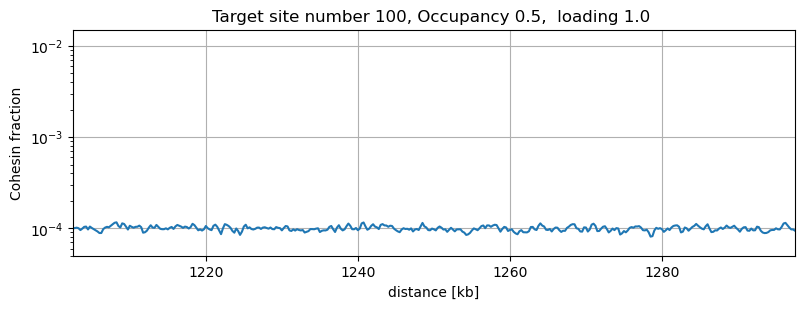

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_10_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 0.9591487623351589
73060.8
74107.41074107411


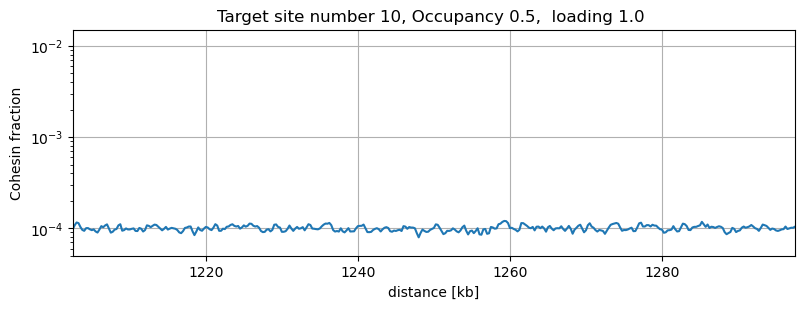

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_12_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 0.9423545825564262
74329.1
74107.41074107411


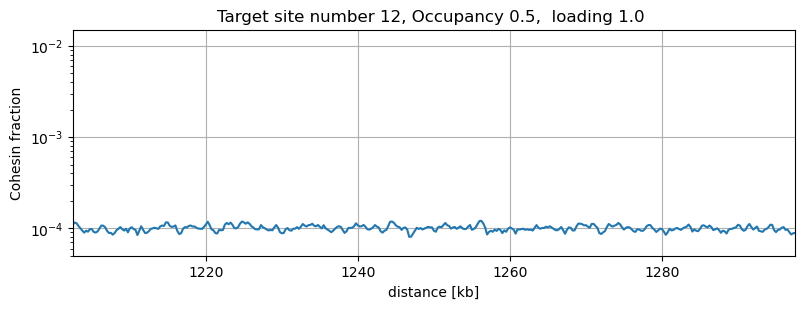

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_16_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 1.1429149391839477
76171.0
74107.41074107411


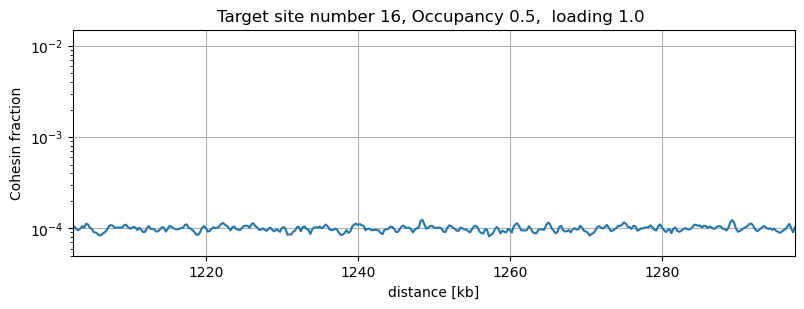

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_1_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 0.959790500890573
72180.5
74107.41074107411


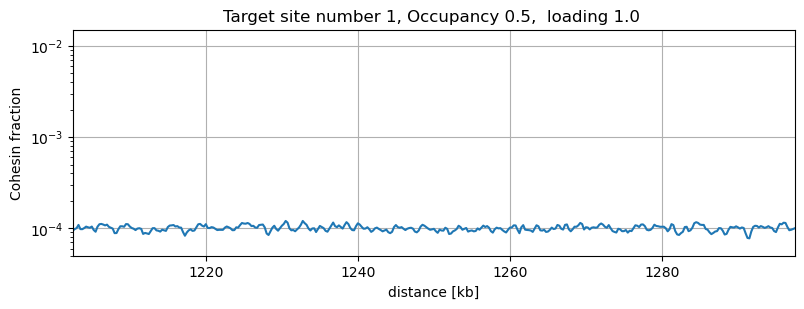

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_20_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 1.0028187926255931
75753.9
74107.41074107411


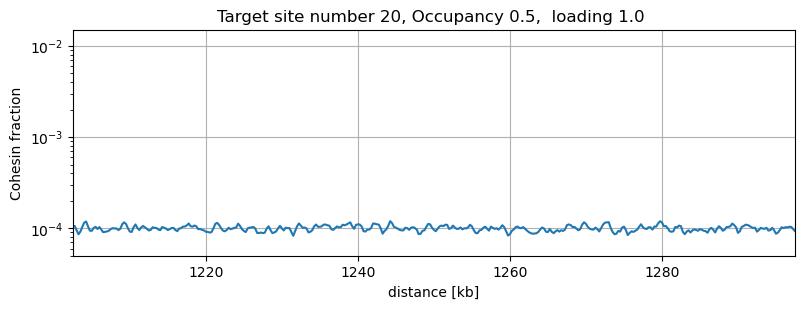

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_24_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 0.9924905368217918
73814.3
74107.41074107411


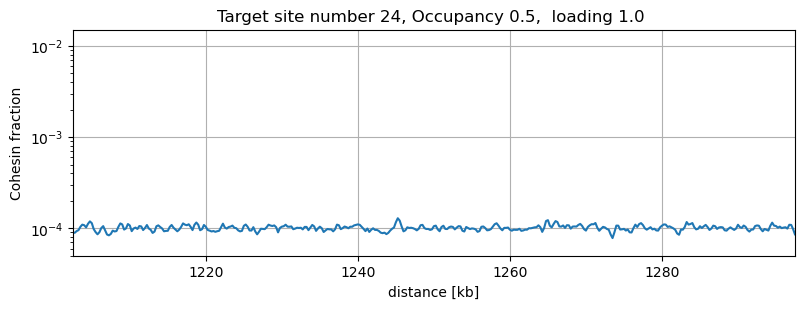

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_2_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 0.972381481552891
75233.9
74107.41074107411


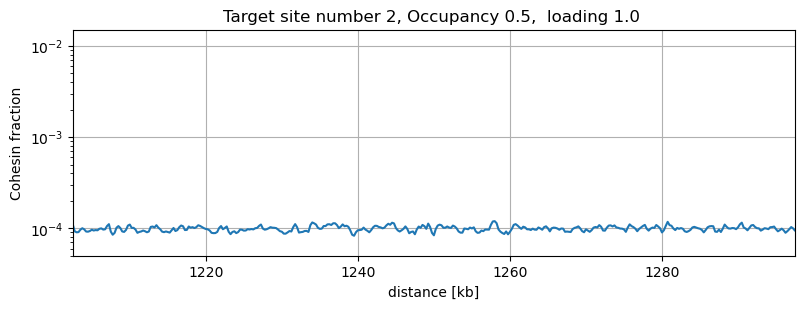

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_30_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 1.02768394709583
76865.3
74107.41074107411


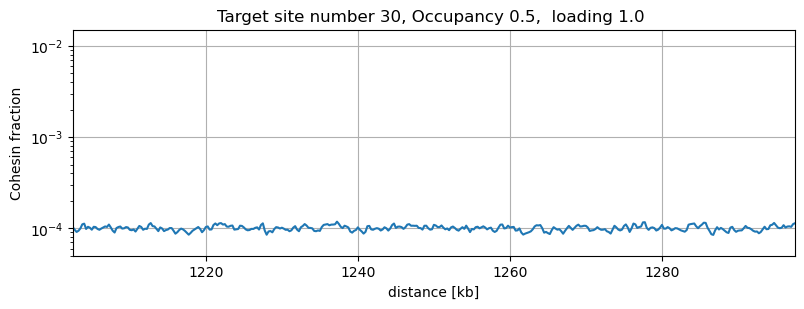

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_3_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 0.9825807926442076
72305.5
74107.41074107411


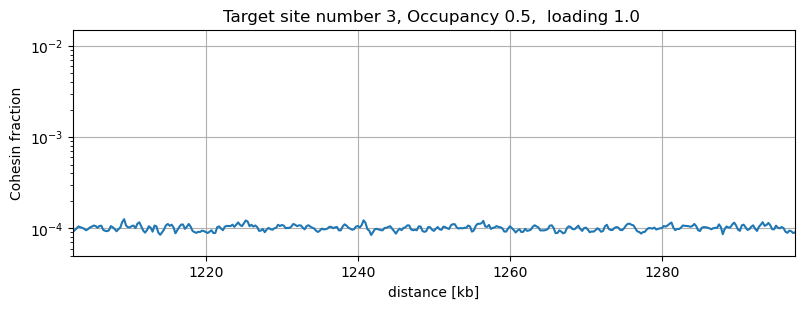

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_40_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 0.9751736016926165
72166.7
74107.41074107411


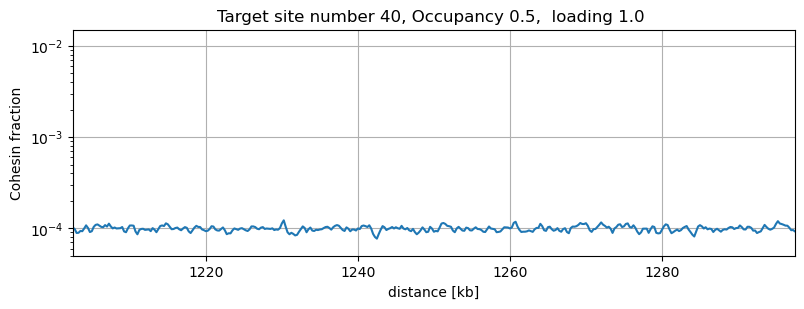

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_4_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 0.9601254874365966
76209.1
74107.41074107411


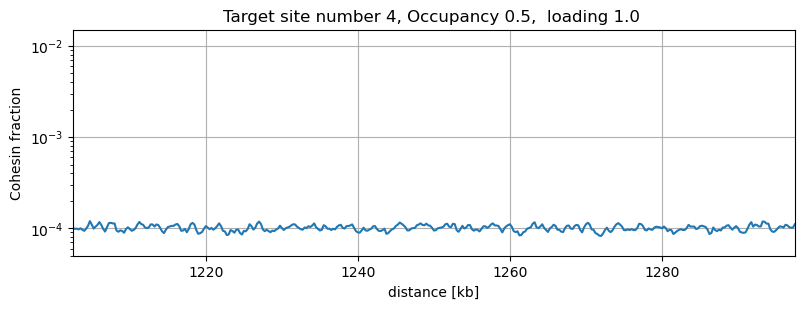

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_50_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 1.0313856858441655
74733.2
74107.41074107411


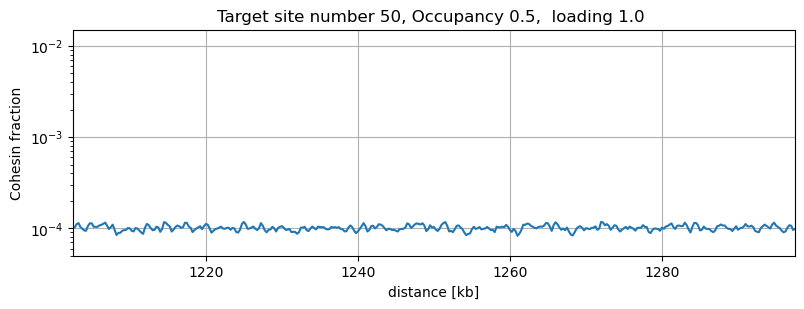

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_5_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 1.0169599135456417
74692.3
74107.41074107411


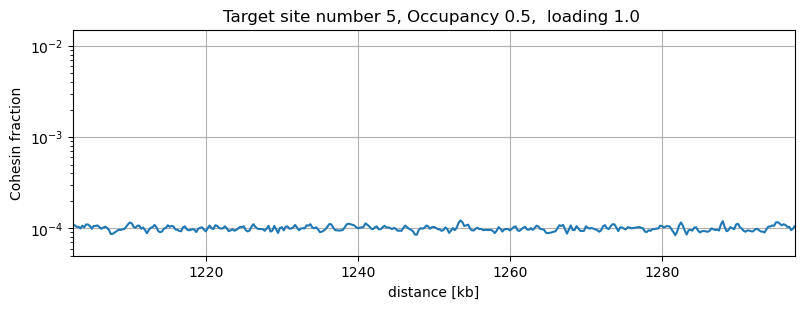

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_60_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 1.0151429209852352
77985.7
74107.41074107411


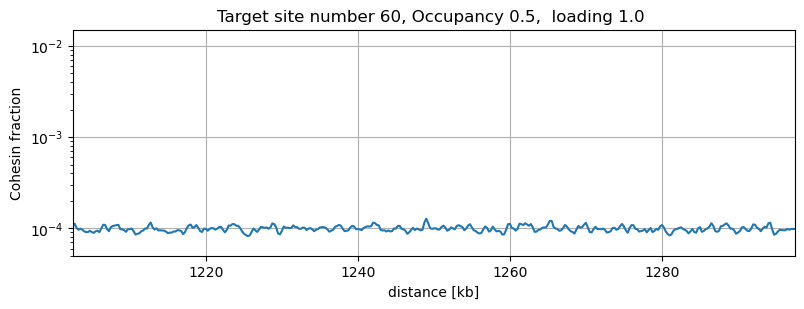

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_6_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 0.9867251659354258
73959.2
74107.41074107411


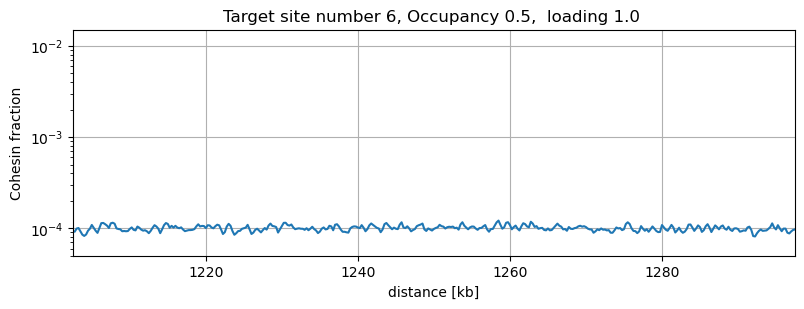

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_80_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 0.988815571152945
73605.4
74107.41074107411


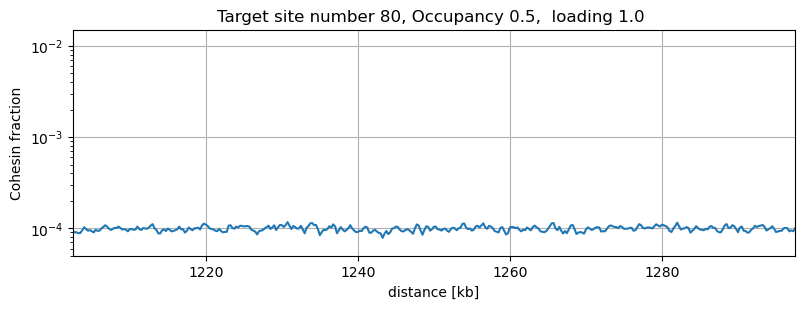

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0001_targetsnum_8_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 0.9363968219884046
72249.9
74107.41074107411


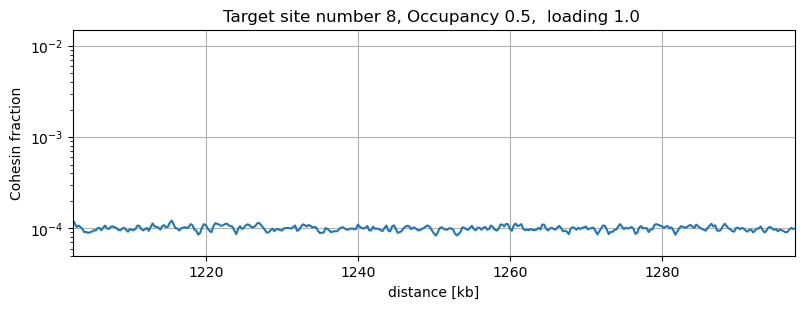

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0005_targetsnum_100_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 1.0684377863463892
107312.3
74107.41074107411


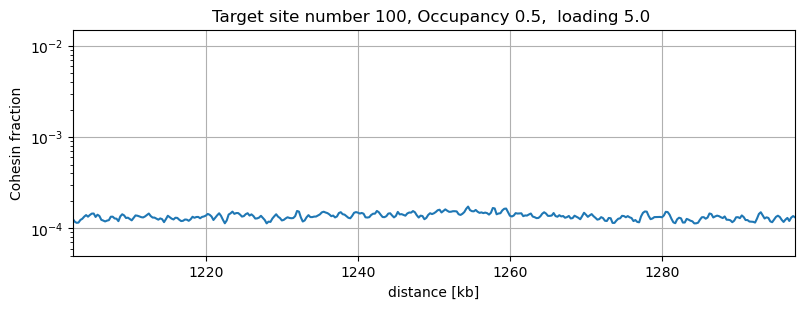

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0005_targetsnum_10_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 1.1118567031107858
81094.2
74107.41074107411


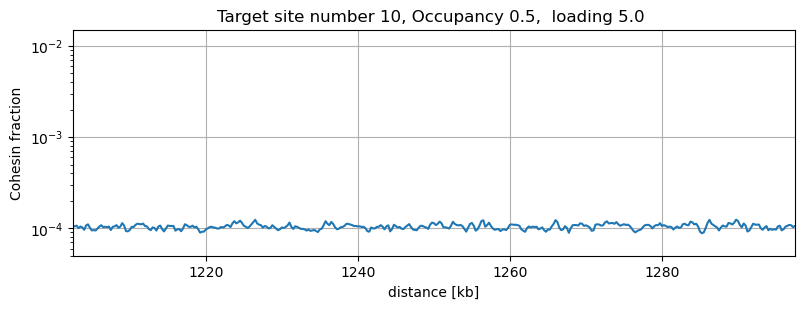

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0005_targetsnum_12_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1
relative ratio is 1.023783638638016
76185.0
74107.41074107411


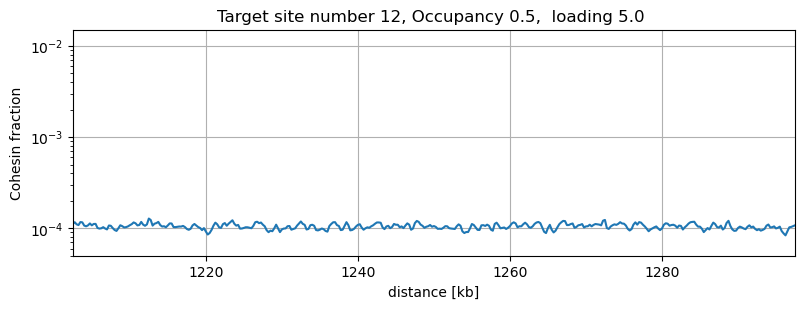

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66.0_slife_66.0_birth_0.0005_targetsnum_16_deltactcf_1600_pause_0.0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1


In [ ]:
window_size = 1
numx,numy = 1,len(path_dict)
rep = 1 
mon = 1000
site = 10
ba_time = 2500000
hist_dict = {}
c=1
sns.reset_defaults()
file = open('data/relative_ratio_target_targetnum_res_rev_further_15kb.csv','w')
file.write('birth,target_s_num,deltactcf,clife,cof,sep,face,ratio\n')
dire = '/scratch1/rahmanin/target_loading_cohesin/target/target_mult_sites/sims/'
for name in list(path_dict.keys())[:]:
    try:
        params=[ast.literal_eval(i) for i in name.split('folder_')[1].split('_')[1::2]]
        face, back, clife, cof, life, slife, birth, target_s_num, deltactcf, pause, sep, site, mon, rep, step, vel = params
        if deltactcf!= 1600: continue
        c+=1
        print(name)
        mapN=mon*site
        lefs = h5py.File(dire+name+'/LEFPositions.h5','r')["positions"]
        lef_lefts = lefs[ba_time:,:,0].flatten()
        lef_rights = lefs[ba_time:,:,1].flatten()
        ctcfrightlist = np.array(h5py.File(dire+name+'/LEFPositions.h5','r')['CTCF_sites_right'])
        ctcfleftlist = np.array(h5py.File(dire+name+'/LEFPositions.h5','r')['CTCF_sites_left'])
        lst = np.array(list(ctcfrightlist))# + list(ctcfleftlist))
        
        lef_lefts = lefs[ba_time:,:,0].flatten()
        lef_rights = lefs[ba_time:,:,1].flatten()
        lef_positions = np.hstack((lef_lefts,lef_rights))
    
        #plt.figure(figsize = (8.15,1.95))
        plt.figure(figsize = (8.15,3.195))
        a,b = np.histogram(  np.mod( np.hstack((lef_lefts,lef_rights)) , mapN ), np.arange(0,mapN,1))
    
        plt.scatter(5001, 0.0001, marker='P', color='orange', s=100)
        plt.plot(np.arange(len(a))*0.25,a/np.sum(a), label=name)
        ratio = (np.sum(a[4998:5002])/((np.sum(a[5080:5084])+np.sum(a[4916:4920]))/2))
        print('relative ratio is %s'%ratio)
        print(np.sum(a[4995:5005])/10)
        print(np.mean(a))
        file.write('%s,%s,%s,%s,%s,%s,%s,%s\n'%(birth,target_s_num, deltactcf,clife,cof,sep,face,ratio))
        plt.scatter(ctcfrightlist,np.zeros(len(ctcfrightlist))+0.000095,marker='<',color='red',s=150,zorder=3)
        plt.scatter(ctcfleftlist,np.zeros(len(ctcfleftlist))+0.000095,marker='>',color='red',s=150,zorder=3)

        plt.grid(True)
        
        plt.ylim(0.00005, 0.015)
        plt.xlim(4810*0.25, 5190*0.25)
        hist_dict[name] = a/np.sum(a)
    
        plt.ylabel('Cohesin fraction')
        plt.yscale('log')
        plt.xlabel('distance [kb]')
        plt.title(r'Target site number %s, Occupancy 0.5,  loading %s '%(target_s_num, np.round(birth/0.0001)))
        
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print('file %s should be process'%name)
        
file.close()

50
17.0 17.0 74


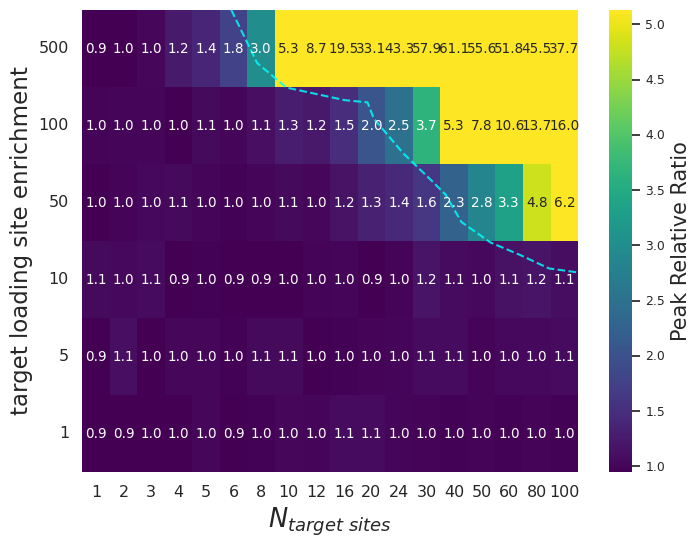

In [8]:
file = pd.read_csv('data/relative_ratio_target_targetnum_res_rev_further.csv') 

file['birthp']=(file['birth']/0.0001).astype(int)

file['deltactcf']=file['deltactcf']*0.125
deltactcf = file['deltactcf']
file = file[file['birthp']<1000]
unique_birth=np.unique(birth)
unique_deltactcf = np.unique(deltactcf)
clife = np.unique(file['clife'])[0]
for deltactcf in np.unique(file['deltactcf']):
    print(life)
    for cof_val in np.unique(file['cof']):
        for sep_vals in [ 74]:
            print(clife, cof_val,sep_vals)
            new_file = file[file['deltactcf']==deltactcf]
            new_file = new_file[new_file['sep']==sep_vals]    
            new_file = new_file[new_file['cof']==cof_val]
            new_file['ratio']=new_file['ratio'].round(3)
           
            new_file_filtered = new_file.drop_duplicates(keep = 'first')
            
            dtaframe_grouped = new_file_filtered.groupby(['birthp', 'target_s_num'], as_index=False).mean()
            
            heatmap_data = dtaframe_grouped.pivot('birthp', 'target_s_num', 'ratio')
            # Create the heatmap using seaborn
            plt.figure(figsize=(8, 6))
            im = sns.heatmap(heatmap_data, annot=True, cmap='viridis', fmt='1.1f',vmin=0.95,vmax=5.131, cbar_kws={'label': 'Frip score'} )
            sns.set(font_scale=0.81)
            cbar = im.collections[0].colorbar
            cbar.set_label('Peak Relative Ratio', fontsize=15)
            ##### making equepotentiala
            val = 1.8
            cline_num=18
            coline_num=6
            smooth_scale = 1
            d = gaussian_filter(heatmap_data.to_numpy(), sigma=0.15)
            
            z = ndimage.zoom(heatmap_data.to_numpy(), smooth_scale)

            cntr1 = im.contour(np.linspace(0, cline_num, cline_num * smooth_scale),
                           np.linspace(0, coline_num, coline_num * smooth_scale),
                           d, levels=[1.91], colors='cyan', linestyles='dashed', alpha=0.83)
            #Hansen = utvis.make_equipotential_lines(heatmap_data,[val], label = '', expand_cof = 500,
            #                                 color='cyan', linestyles='dashed')
        
            # Add legend manually for the contours
            #hansen_line, = plt.plot([], [], color='cyan', linestyle='dashed', alpha=0.83, label='%s'%val)
            plt.xlabel(r'$N_{target\ sites}$', fontsize = 18.5)
            plt.xticks(fontsize =11.5)
            #plt.title(r'proc=%s kb, $\delta_{ctcf, target}$=%s kb, $\tau_b$/$\tau_E$=%s, Occup = %s, density= 1/%s kb'%(life*5, 250, np.round(clife/life,1),np.round(clife/(clife+cof_val),1), sep_vals*2.5), fontsize = 11)
            plt.ylabel(r'target loading site enrichment', fontsize =16.5)
            plt.yticks(fontsize=11.5, rotation=0)
            plt.gca().invert_yaxis()
            plt.savefig('figs/heatmap.pdf')
            plt.show()

In [8]:
#The Md simualtions HiC maps

In [11]:
path_dict = {}

directory = './maps'

for name  in glob.glob(directory+'/folder_*'):
    path_dict[name.split('/maps/')[1][:]]= name
path_dict = dict(sorted(path_dict.items()))
print(len(path_dict))

207


folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_100_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


/home1/rahmanin/.conda/envs/openmm-env/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in log10
  if sys.path[0] == "":


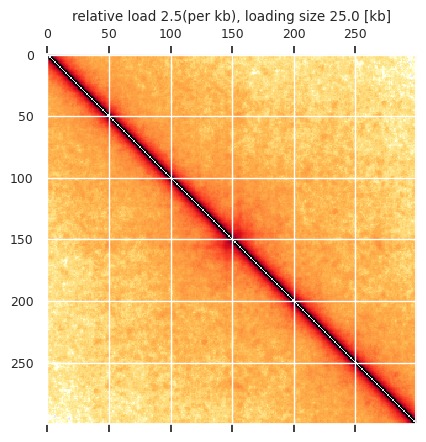

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_100_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


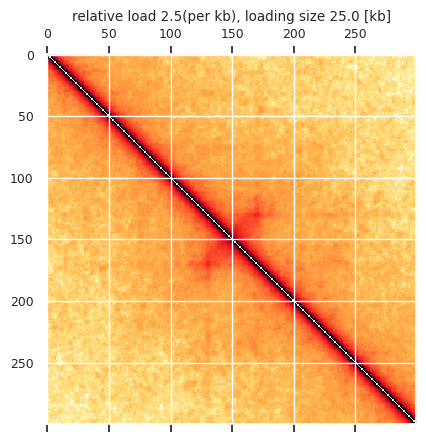

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_10_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


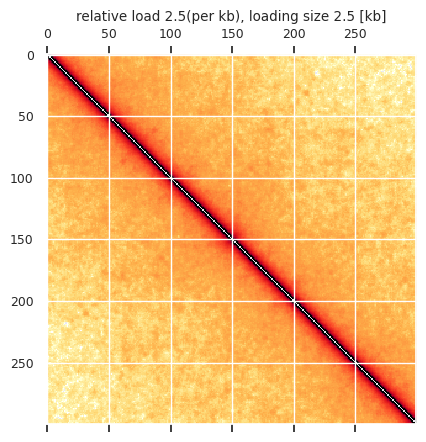

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_10_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


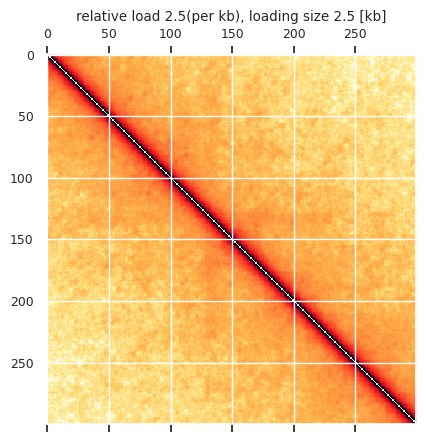

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_12_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


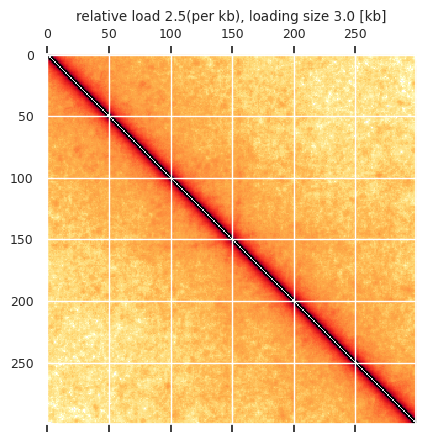

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_12_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


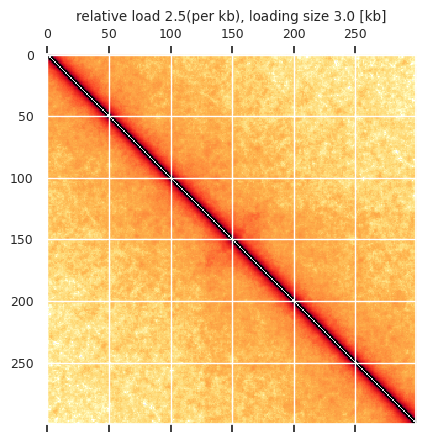

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_16_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


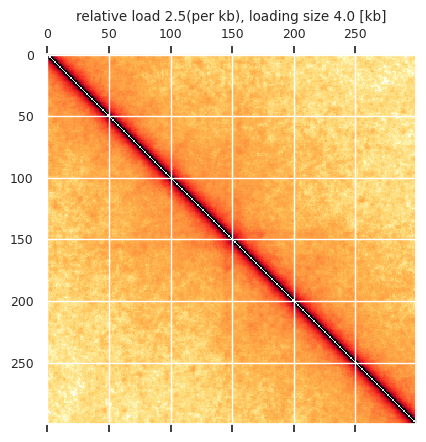

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_16_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


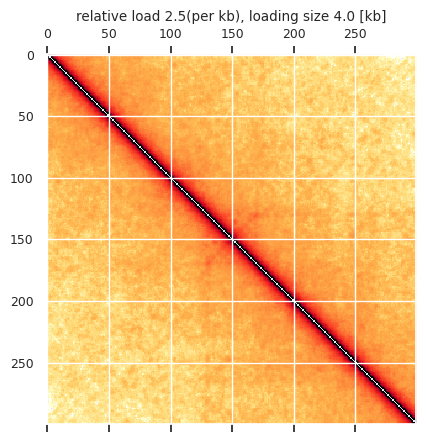

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_1_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


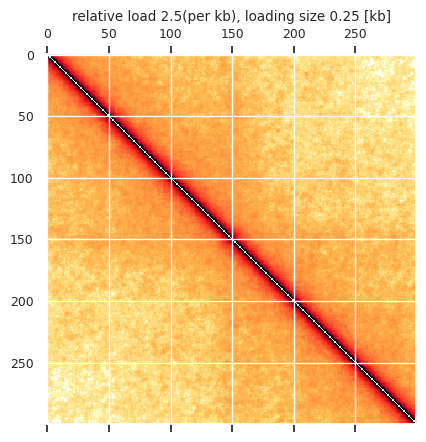

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_24_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


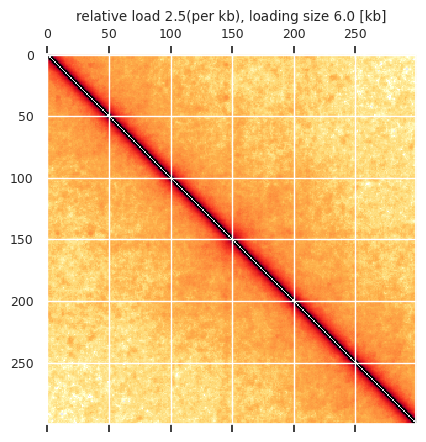

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_24_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


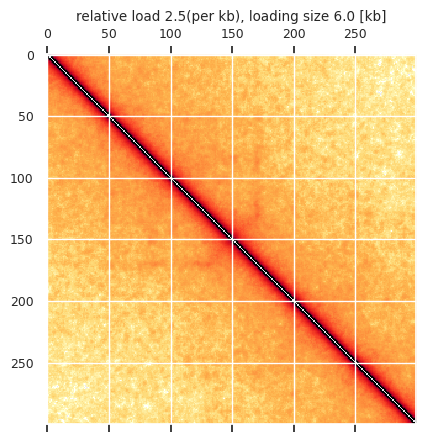

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_30_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


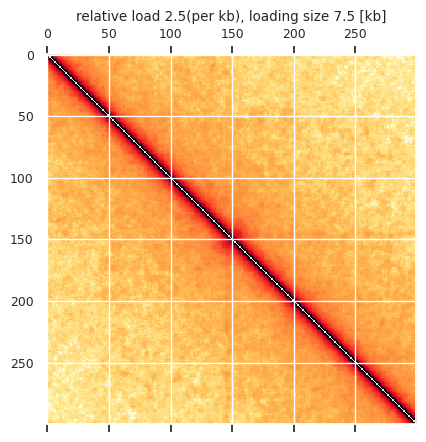

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_30_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


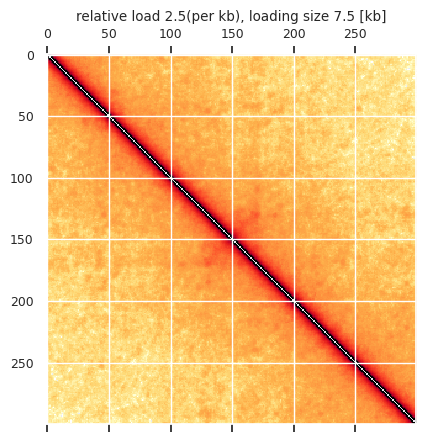

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_3_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


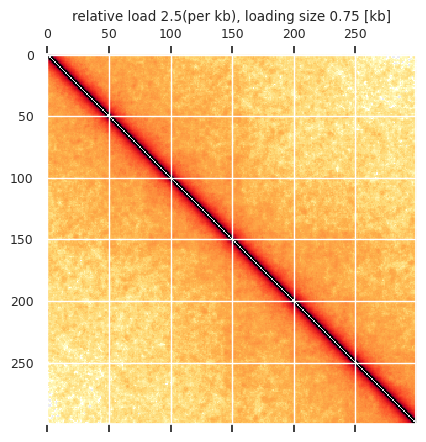

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_3_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


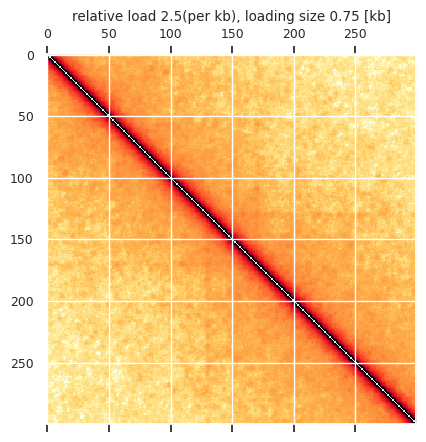

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_40_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


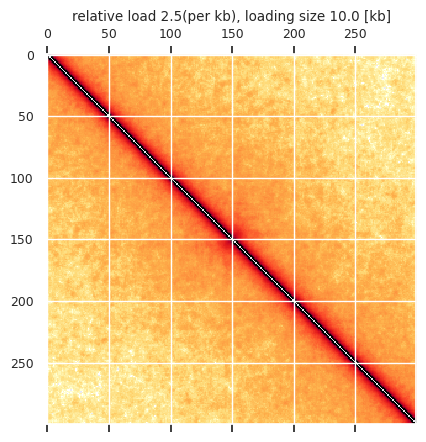

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_40_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


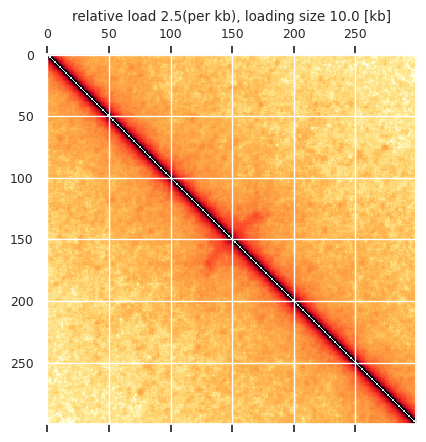

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_50_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


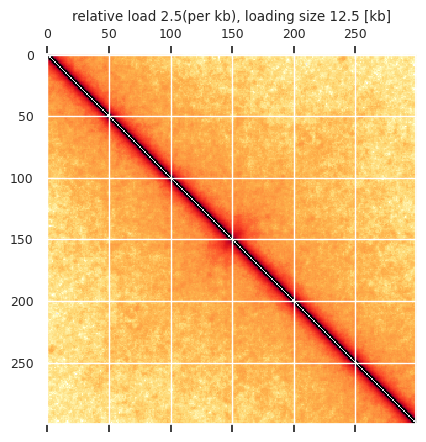

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_50_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


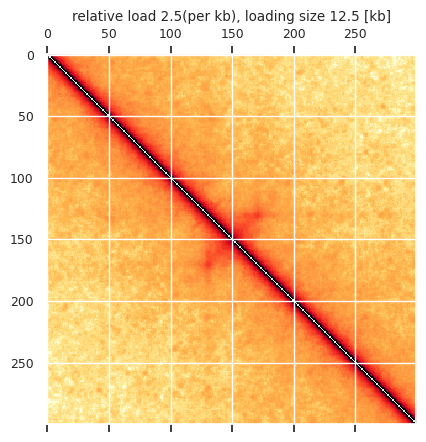

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_60_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


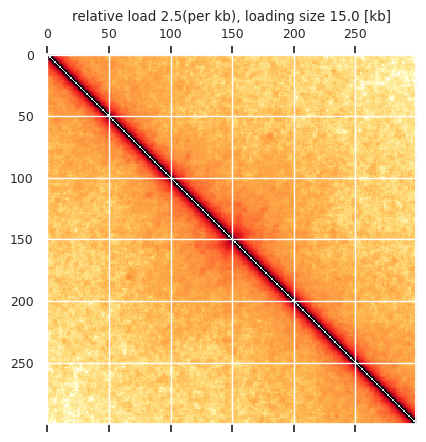

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_60_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


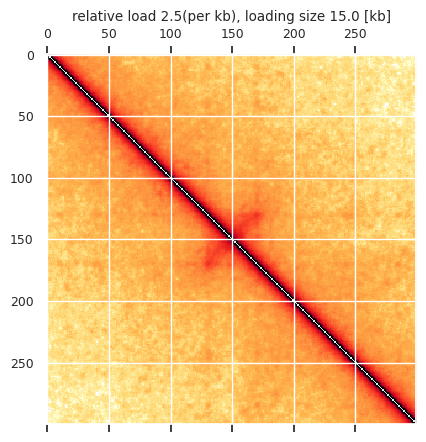

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.001_targetsnum_8_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


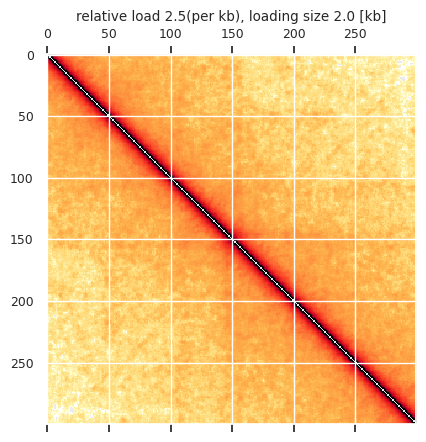

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_100_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


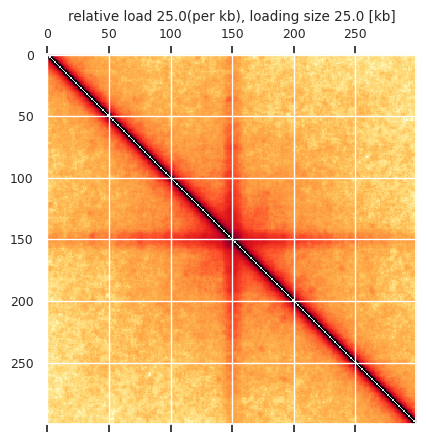

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_100_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


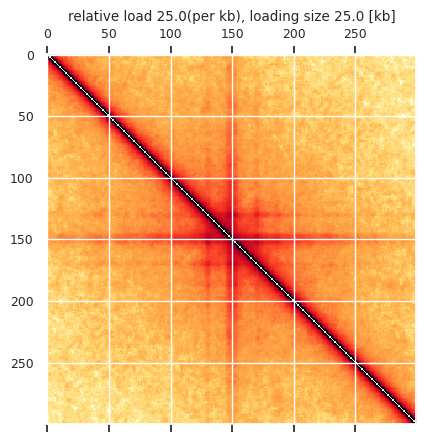

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_10_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


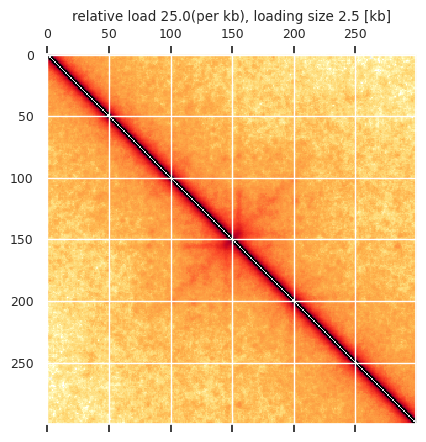

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_10_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


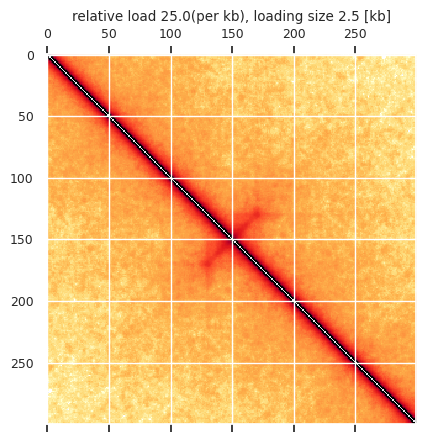

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_12_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


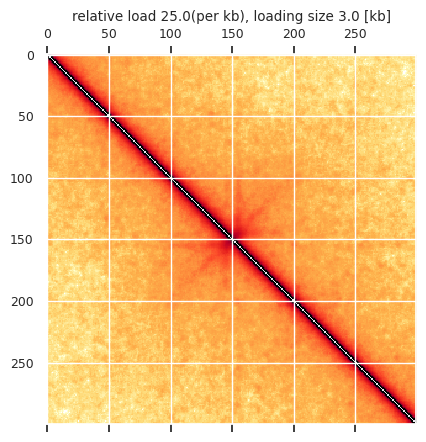

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_12_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


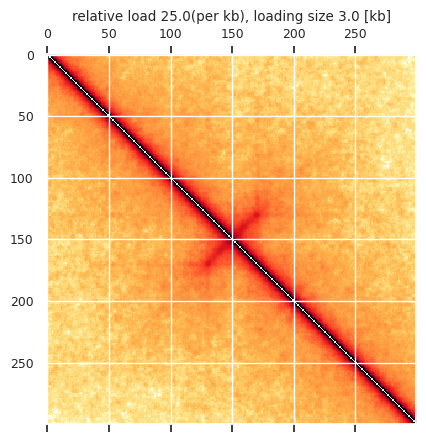

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_16_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


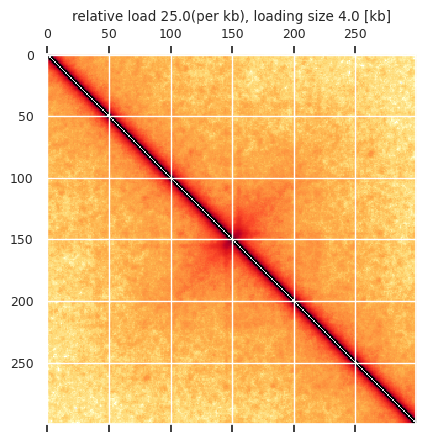

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_16_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


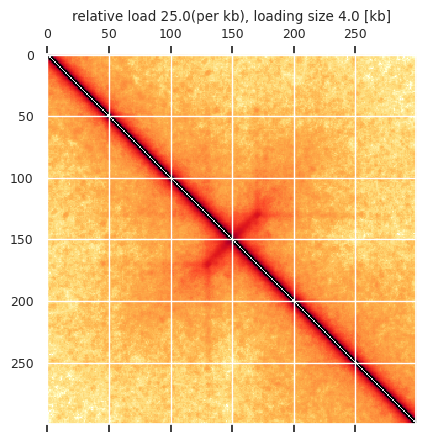

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_1_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


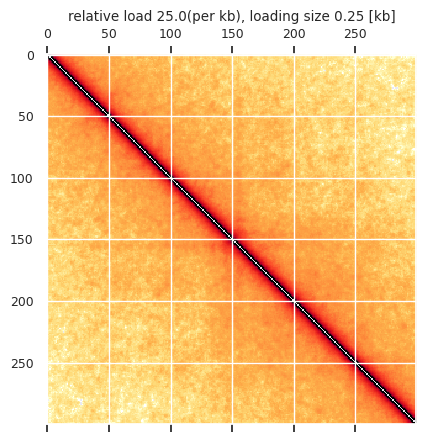

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_1_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


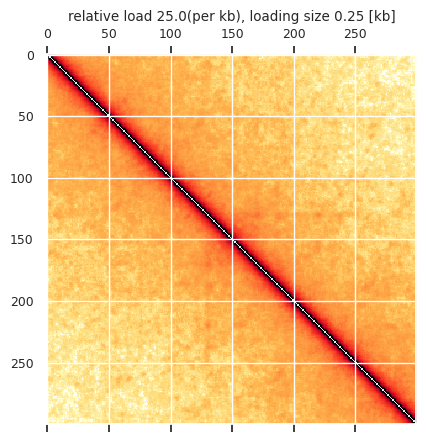

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_24_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


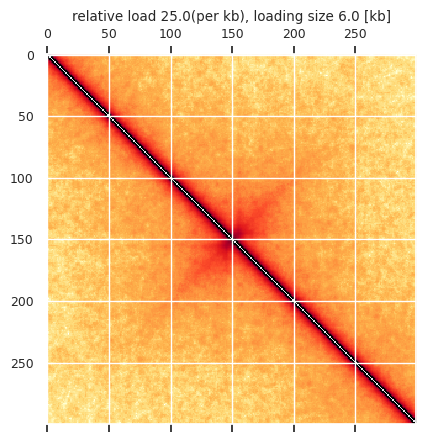

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_24_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


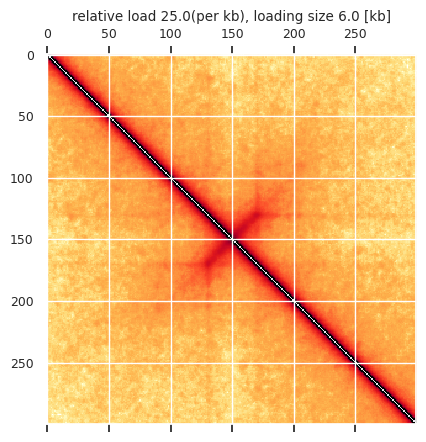

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_30_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


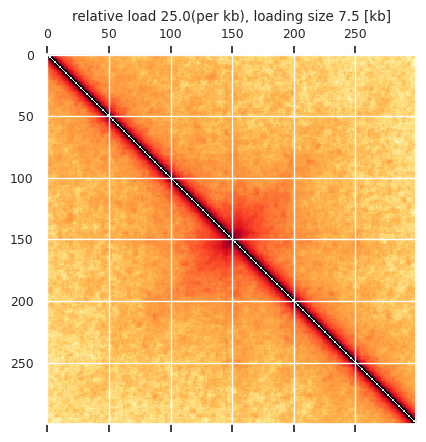

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_30_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


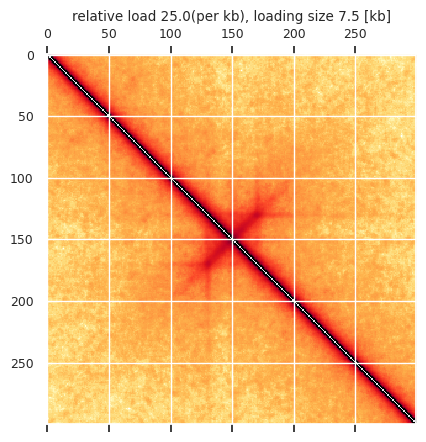

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_3_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


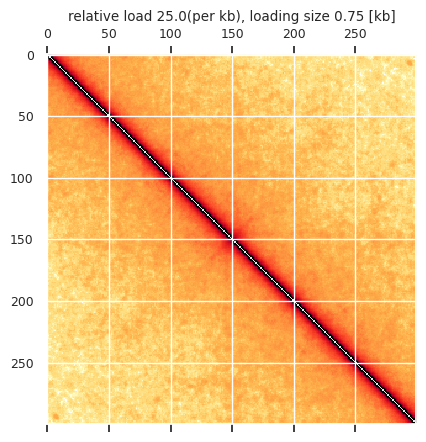

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_3_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


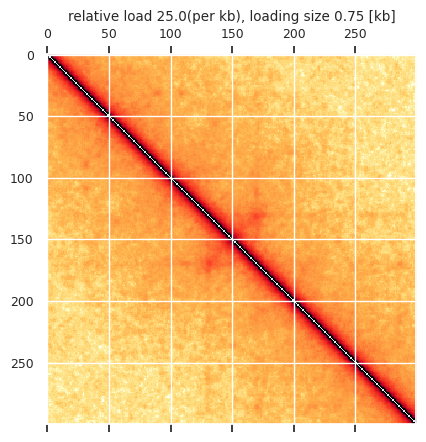

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_40_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


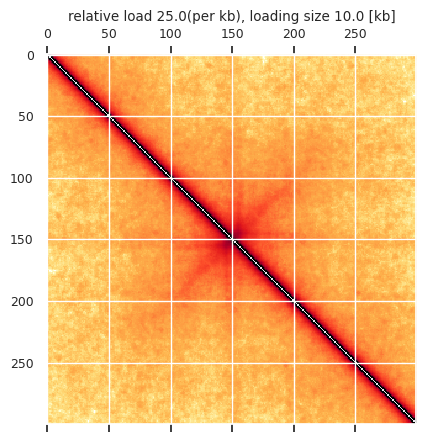

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_40_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


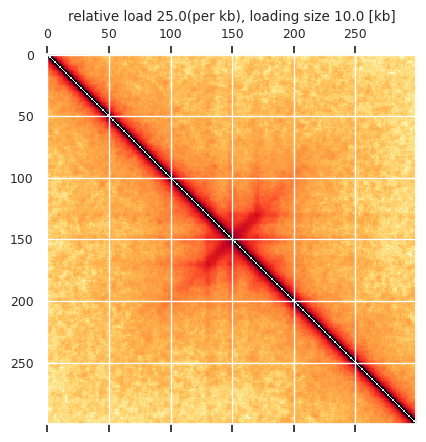

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_50_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


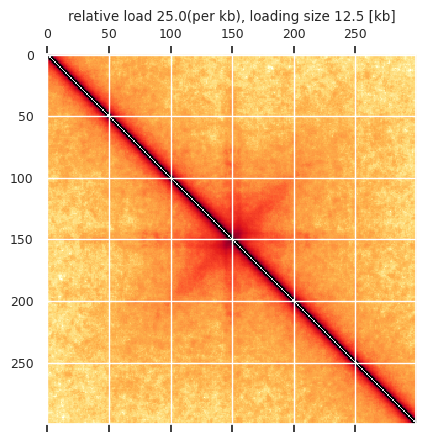

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_50_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


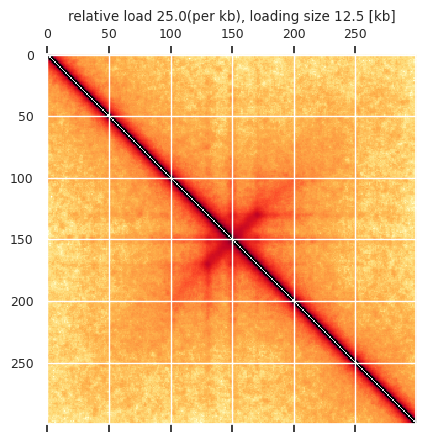

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_5_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


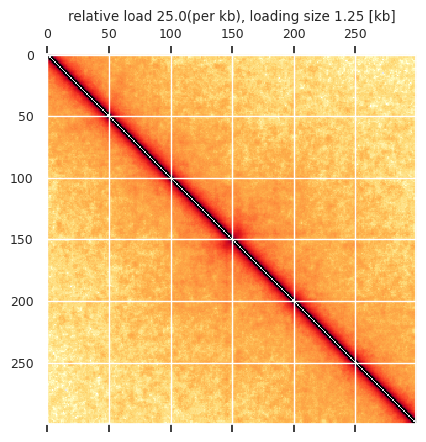

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_5_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


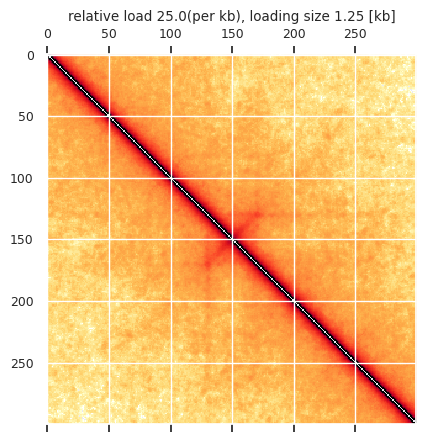

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_60_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


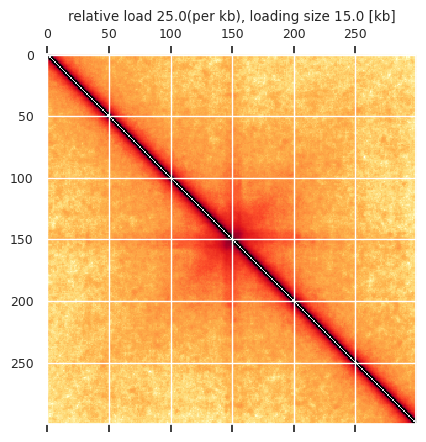

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_60_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


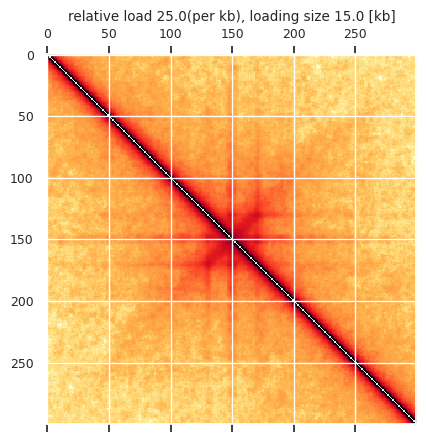

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_8_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


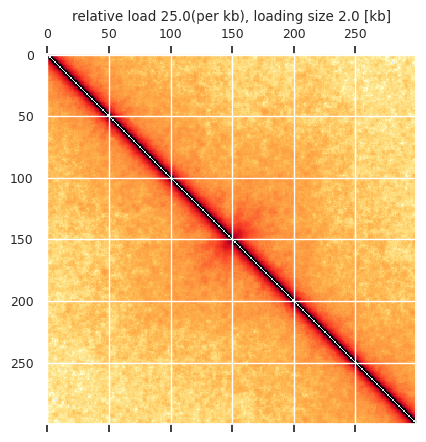

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.01_targetsnum_8_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


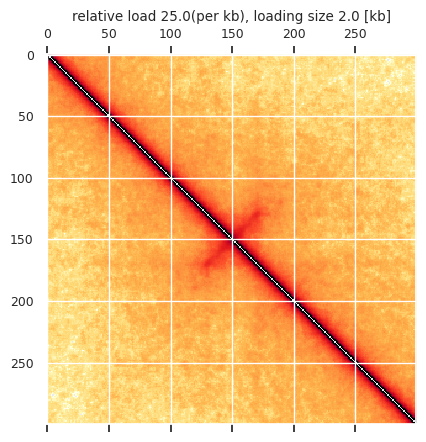

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_10_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


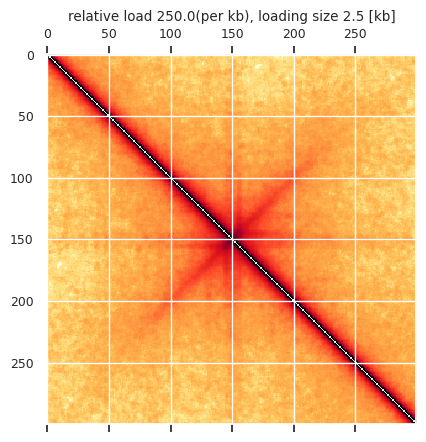

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_10_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


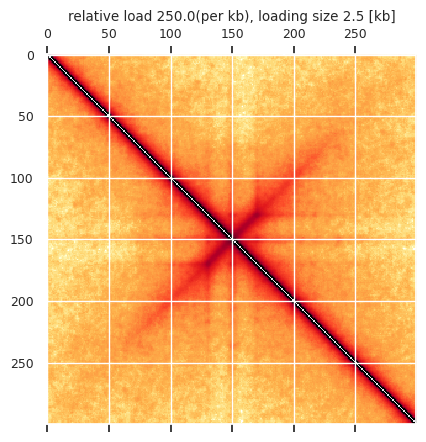

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_12_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


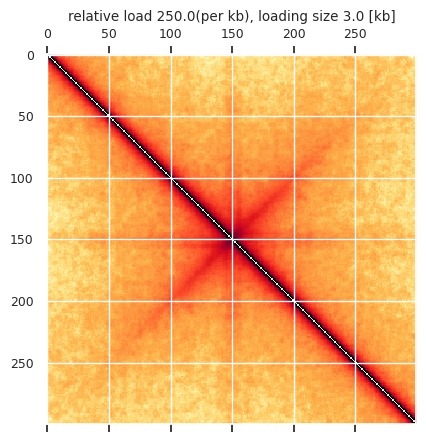

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_12_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


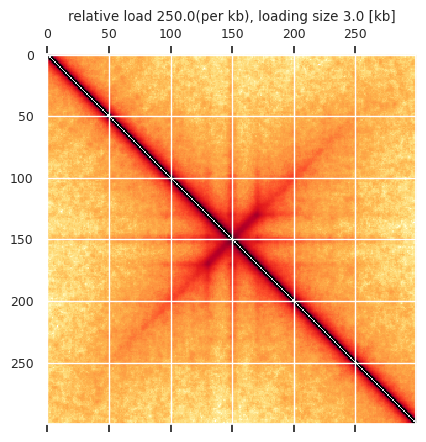

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_16_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


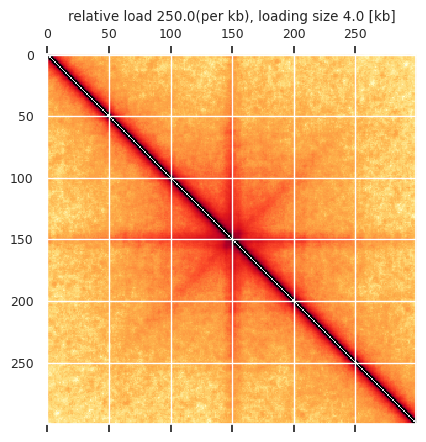

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_16_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


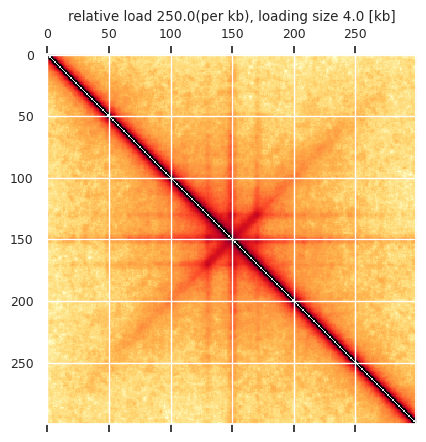

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_1_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


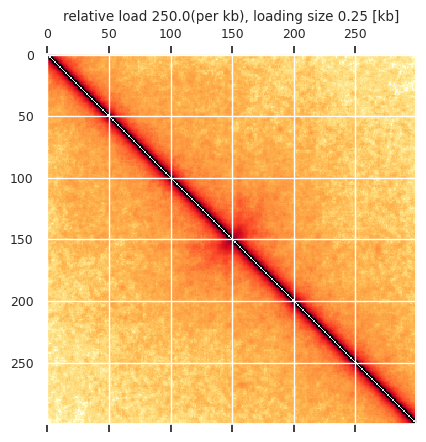

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_1_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


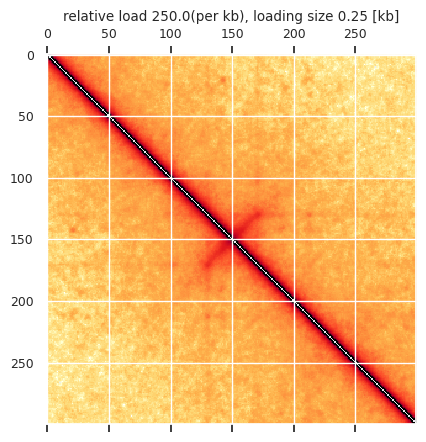

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_24_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


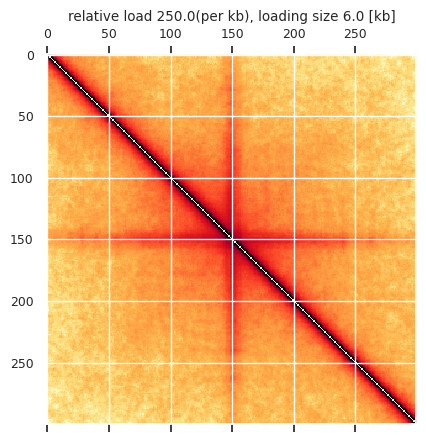

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_24_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


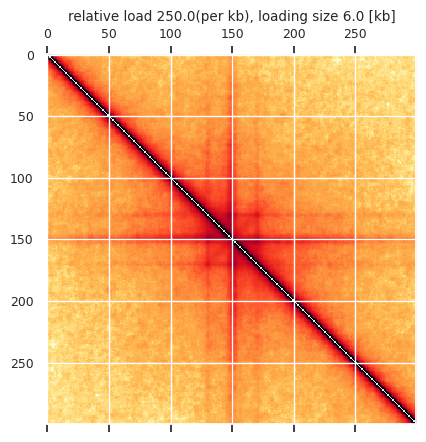

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_30_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


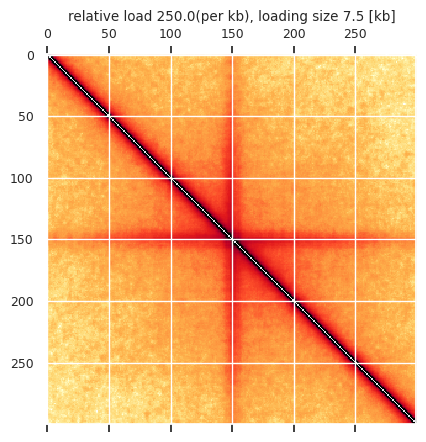

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_30_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


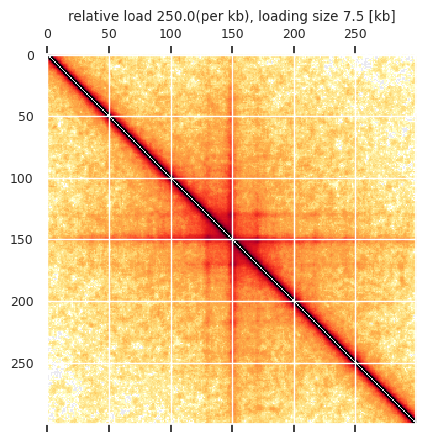

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_3_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


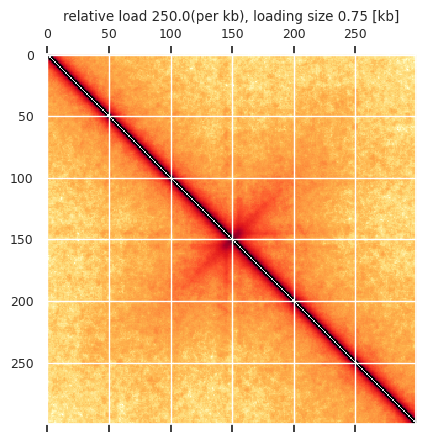

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_3_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


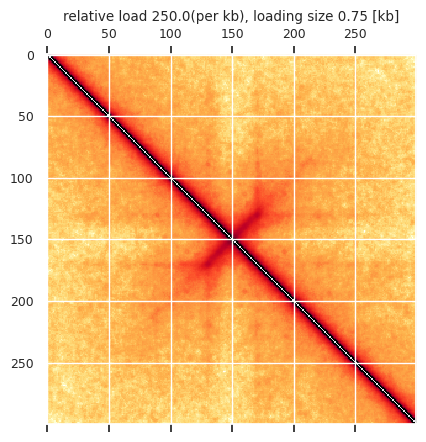

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_5_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


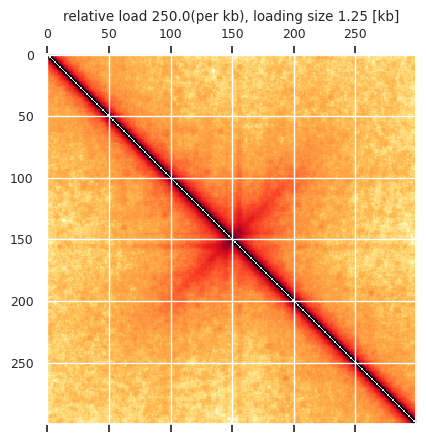

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_5_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


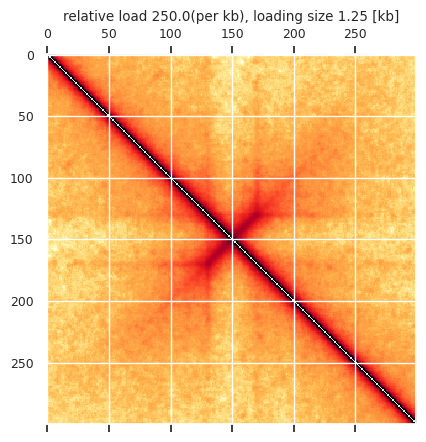

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_8_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


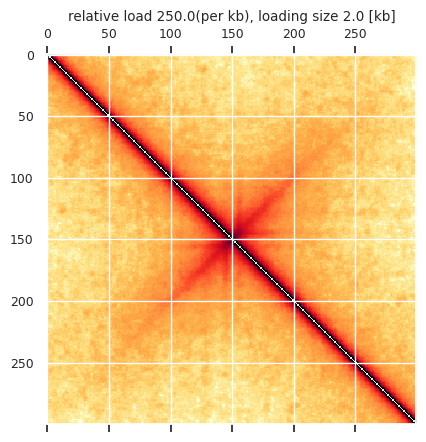

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.1_targetsnum_8_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


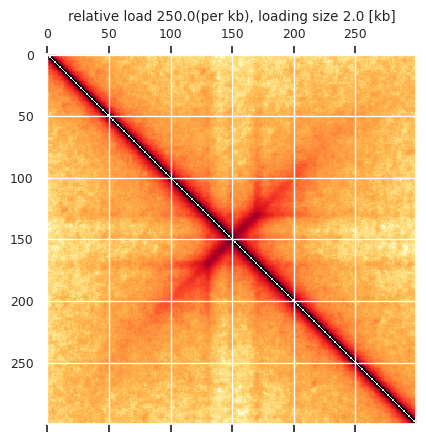

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_10_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


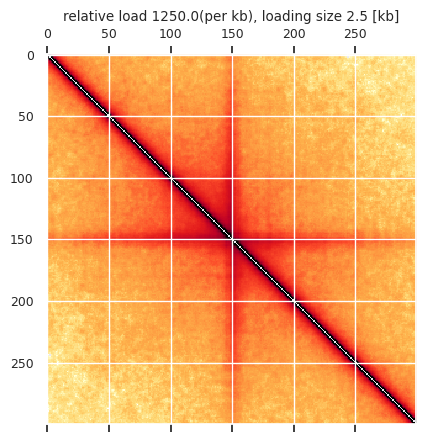

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_10_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


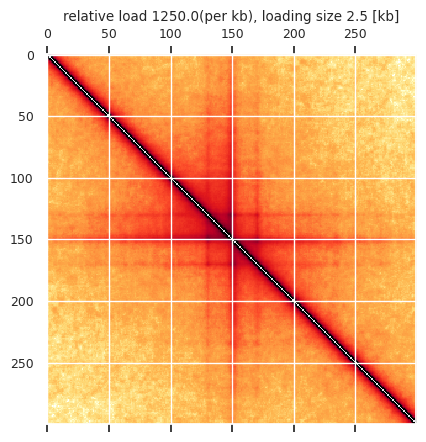

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_12_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


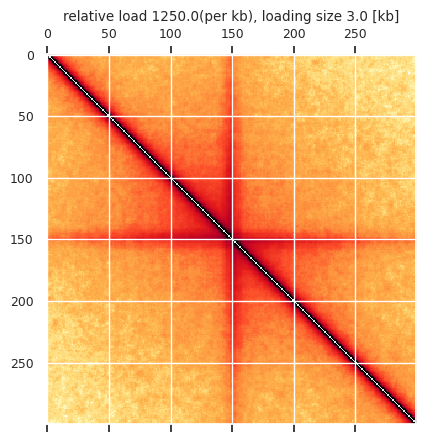

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_12_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


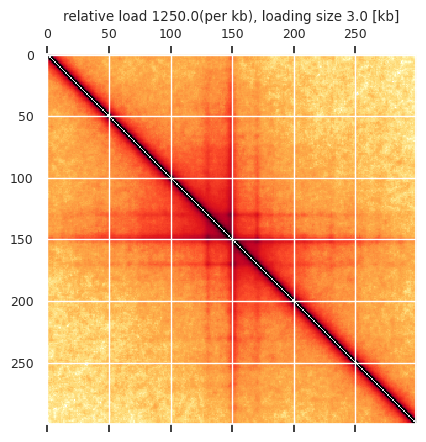

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_16_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


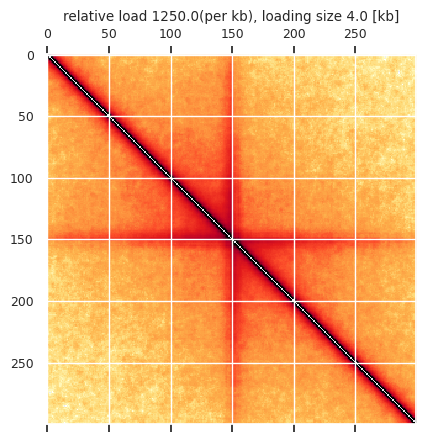

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_16_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


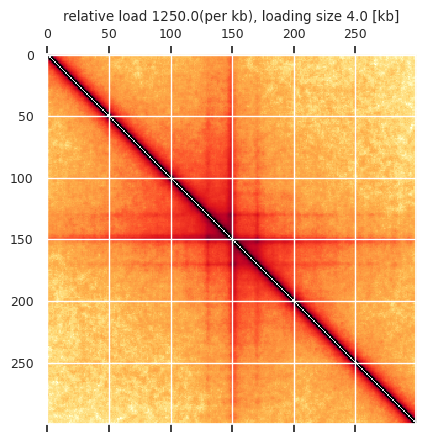

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_1_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


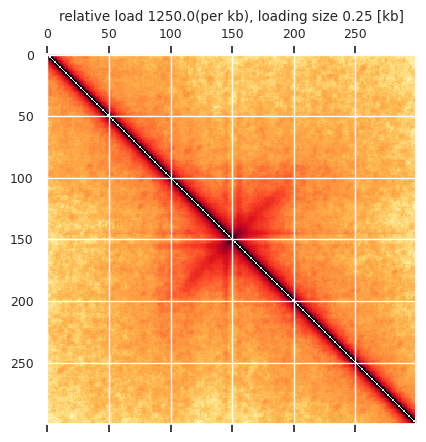

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_1_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


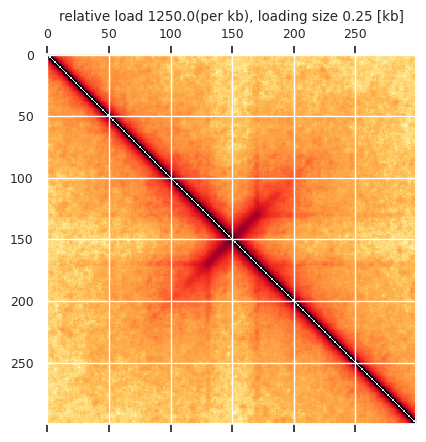

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_24_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


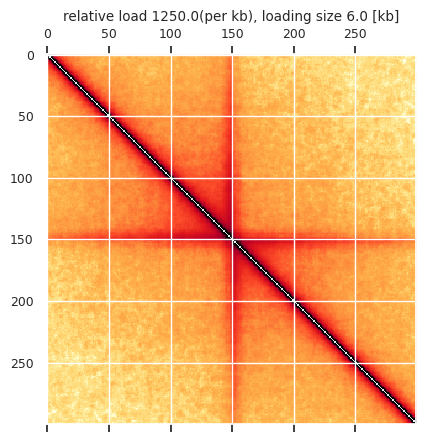

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_24_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


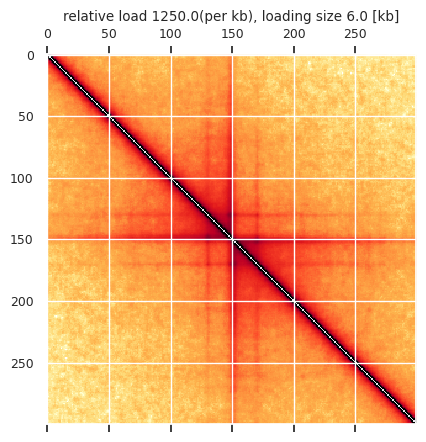

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_3_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


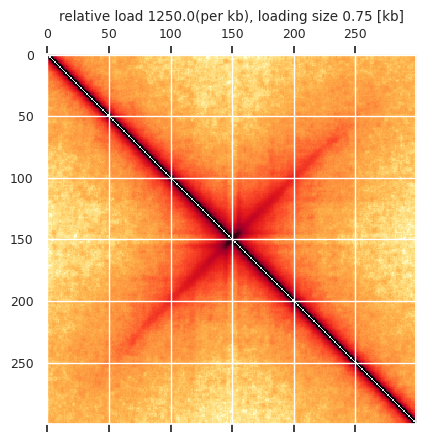

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_3_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


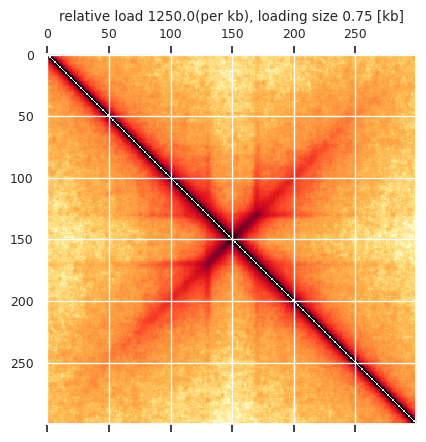

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_5_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


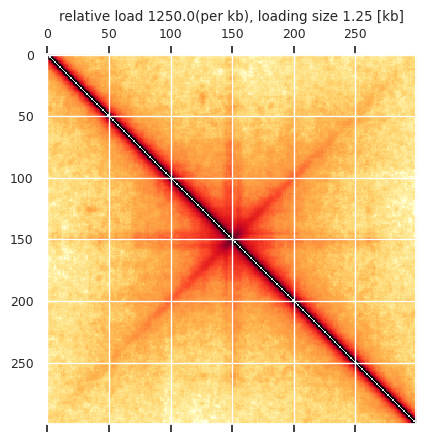

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_5_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


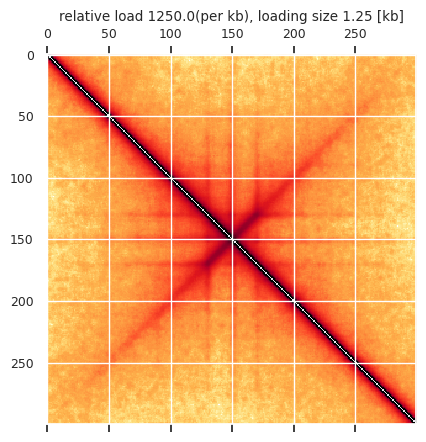

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_8_deltactcf_100_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


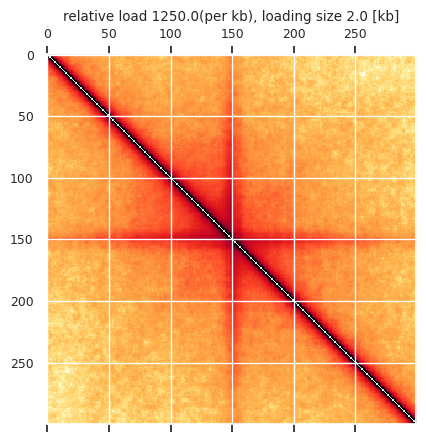

folder_face_1.0_back_0_Clife_17.0_Cof_17.0_life_66_slife_66_birth_0.5_targetsnum_8_deltactcf_400_pause_0_sep_74_site_10_monomer_1000_replica_1_steps_200_vel_1.npz


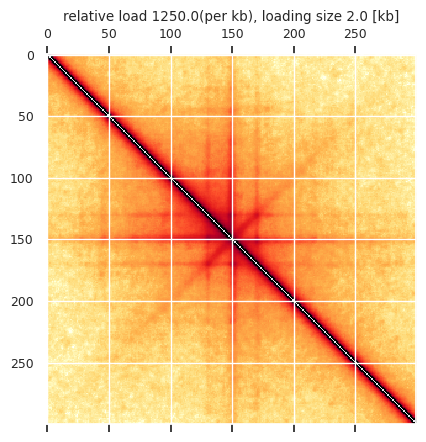

In [14]:
for name in path_dict.keys():
    #i+=1
    #print(name)
    params=[ast.literal_eval(i) for i in name.split('npz')[0].split('folder_')[1].split('_')[1::2]]
    face, back, clife, cof, life, slife, birth, targetnum, deltactcf, pause, sep, site, mon, rep, step, vel = params
    if life ==66 and sep==74 and birth>=0.001 and deltactcf<1000:
        print(name)
        data=np.load('%s' % path_dict[name])
        mrc=data['arr_0']
        mrc  = mrc.astype(float)
        mrc /= np.median(np.diag(mrc,2))
        mat = np.log10(mrc)
        vmax = np.median(np.diag(mat,2))
        vmin = vmax - 3
        im=plt.matshow(mat[350:650,350:650], cmap='fall',fignum=False);
        #cbar=plt.colorbar(im,label='Contact frequency [log]')
        #cbar.set_label(label='Contact frequency [log]',fontsize=11.95)
        #cbar.ax.tick_params(labelsize=10.5)
        #cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
        #plt.xticks([0,100,200,300,400,500, 600, 700, 800, 900, 1000],fontsize=8.1)
        #plt.yticks([0,100,200,300,400,500],fontsize=8.1)
        plt.title('relative load prob %s'%500)
        #plt.gca().set_xticklabels(['0kb', '25kb', '50kb','75kb','100kb', '125kb', '150kb', '175kb', '200kb', '225kb', '250kb'])
        #plt.gca().set_yticklabels(['0Mb', '0.25Mb', '0.5Mb','0.75Mb','1Mb', '1.25Mb'])#plt.gca().set_yticklabels([])
        #plt.gca().set_yticklabels([])
        plt.title('relative load %s(per kb), loading size %s [kb]'%((birth/0.0001/4),targetnum/4))
        #plt.savefig('./figs/maps/maps_for_%s.png'%name,transparent=True)
        plt.show()   